# View Fors2 , version short

- **Part 1**
- author : Sylvie Dagoret-Campagne
- affiliation : IJCLab/IN2P3/CNRS
- creation date : 2022/12/19
- update : 2023/05/23
- FORS2 : https://github.com/ericnuss/fors2
- Result of StarLight : /sps/lsst/groups/photoz/fors2/FORS2/ResStarlight



          /Users/dagoret/MacOSX/GitHub/LSST/FORS2>ls -l
              total 0
              drwxrwsr-x  3 dagoret  staff   96 Aug 21  2018 ResStarlight
              drwxr-xr-x  9 dagoret  staff  288 Dec 19 18:01 fors2

## Import

In [1]:
import os,sys
from astropy.io import fits
from astropy.table import Table

In [2]:
# Import some generally useful packages

import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cmx

from matplotlib.backends.backend_pdf import PdfPages

%matplotlib inline
import pandas as pd
from itertools import cycle, islice


In [3]:
from scipy import ndimage

#from scipy import interp as scinterp
from scipy.interpolate import interp1d

import glob
import collections
#from def_raw_seds import *

In [4]:
# to enlarge the sizes
params = {'legend.fontsize': 'large',
          'figure.figsize': (8, 4),
         'axes.labelsize': 'xx-large',
         'axes.titlesize':'xx-large',
         'xtick.labelsize':'xx-large',
         'ytick.labelsize':'xx-large'}
plt.rcParams.update(params)


In [5]:
import matplotlib.offsetbox
props = dict(boxstyle='round',edgecolor="w",facecolor="w", alpha=0.5)

In [6]:
!ls ../../fors2/fors2/data

fits                 fors2_catalogue.fits txt


In [7]:
! pwd

/Users/dagoret/MacOSX/GitHub/LSST/PhotoZ_PhD/StudyFors2SED


In [8]:
from def_raw_seds import *

In [9]:
from raw_data_analysis import *

In [10]:
# Import the primary photometry classes from rubin_sim.photUtils

import rubin_sim.phot_Utils.Bandpass as Bandpass
import rubin_sim.phot_Utils.Sed as Sed
from rubin_sim.data import get_data_dir

In [11]:
#pysynphot_root_path=os.environ['PYSYN_CDBS']
#path_sed_calspec=os.path.join(pysynphot_root_path,'calspec')
# pysynphot
#import pysynphot as S
#S.refs.setref(area=1)
#S.refs.getref()

# Start

In [12]:
cwd=os.path.abspath("")
main_dir = cwd
print(f"notebook current executing path : {cwd}")

notebook current executing path : /Users/dagoret/MacOSX/GitHub/LSST/PhotoZ_PhD/StudyFors2SED


## Configuration

### Fors2

## Start

### Catalog

In [13]:
t = Table.read(filename_fits_catalog)

/Users/dagoret/anaconda3/lib/python3.9/site-packages/astropy/io/fits/connect.py:276: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask = data[col.name] == col.null


In [14]:
t

ID,m_ID,RAJ2000,DEJ2000,z,u_z,Rmag,RV,e_RV,RT,Nsp,Lines
,,deg,deg,,,mag,km / s,km / s,,,
int16,bytes1,float64,float64,float64,bytes1,float64,int32,int16,float64,int16,bytes77
1,,13.52815,-28.40486,0.55409,,20.79,166227,55,10.0,1,"[OII],H8,K,H"
2,,13.52997,-28.44776,0.34555,,21.18,103665,40,12.3,1,"K,H,G,H{beta}"
3,,13.52552,-28.4208,0.6866,,21.45,210642,48,11.6,4,"[OII],H9,K,H,H{beta},[OIII],H8"
4,,13.52216,-28.40914,0.68653,,21.62,205959,123,10.6,1,"[OII],H9,K,H,G,H{beta}"
7,,13.50974,-28.42972,0.32371,,22.34,97111,11,16.7,6,"[OII],H{beta},[OIII],H{alpha}"
9,,13.50219,-28.40641,0.29266,,21.6,87798,58,13.1,1,"H9,H8,K,H"
...,...,...,...,...,...,...,...,...,...,...,...
738,,13.6437,-28.22527,0.56044,,19.73,168132,126,7.1,1,"K,H,4000{AA}-break,G"


### List

In [16]:
os.makedirs('./fors2out/seds') 

In [17]:
lst=fors2_jct_SL() #remet les spectres dans le rest frame (ie a z=0)

In [18]:
lst

array(['SPEC160', 'SPEC530', 'SPEC475', 'SPEC249', 'SPEC567', 'SPEC137',
       'SPEC422', 'SPEC588', 'SPEC121', 'SPEC571', 'SPEC13', 'SPEC434',
       'SPEC658', 'SPEC526', 'SPEC463', 'SPEC418', 'SPEC674', 'SPEC361',
       'SPEC731', 'SPEC68', 'SPEC87', 'SPEC623', 'SPEC336', 'SPEC459',
       'SPEC91', 'SPEC265', 'SPEC635', 'SPEC662', 'SPEC398', 'SPEC727',
       'SPEC377', 'SPEC245', 'SPEC496', 'SPEC479', 'SPEC183', 'SPEC707',
       'SPEC357', 'SPEC642', 'SPEC584', 'SPEC341', 'SPEC711', 'SPEC204',
       'SPEC654', 'SPEC438', 'SPEC603', 'SPEC253', 'SPEC480', 'SPEC678',
       'SPEC382', 'SPEC697', 'SPEC33', 'SPEC414', 'SPEC551', 'SPEC443',
       'SPEC506', 'SPEC156', 'SPEC639', 'SPEC72', 'SPEC455', 'SPEC510',
       'SPEC394', 'SPEC681', 'SPEC402', 'SPEC25', 'SPEC547', 'SPEC117',
       'SPEC403', 'SPEC24', 'SPEC546', 'SPEC395', 'SPEC680', 'SPEC73',
       'SPEC454', 'SPEC141', 'SPEC511', 'SPEC638', 'SPEC268', 'SPEC287',
       'SPEC442', 'SPEC507', 'SPEC291', 'SPEC32', 'SPEC415',

In [19]:
#var_cut=0.002
var_cut=0.005

In [20]:
qso()

Looking for QSO/OIII lines
('SPEC722', ['broad', 'MgII', '(QSO)'])


('usual normalization', 'SPEC2')
('usual normalization', 'SPEC3')
('usual normalization', 'SPEC9')
('usual normalization', 'SPEC13')
('usual normalization', 'SPEC19')
('usual normalization', 'SPEC24')
('usual normalization', 'SPEC25')
('usual normalization', 'SPEC30')
('usual normalization', 'SPEC31')
('usual normalization', 'SPEC32')
('usual normalization', 'SPEC33')
('usual normalization', 'SPEC34')
('usual normalization', 'SPEC35')
('usual normalization', 'SPEC36')
('usual normalization', 'SPEC37')
('usual normalization', 'SPEC45')
('usual normalization', 'SPEC47')
('usual normalization', 'SPEC49')
('usual normalization', 'SPEC51')
('usual normalization', 'SPEC55')
('usual normalization', 'SPEC57')


/Users/dagoret/MacOSX/GitHub/LSST/PhotoZ_PhD/StudyFors2SED/raw_data_analysis.py:78: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(12, 6), dpi=100)


('usual normalization', 'SPEC58')
('usual normalization', 'SPEC59')
('usual normalization', 'SPEC61')
('usual normalization', 'SPEC62')
('usual normalization', 'SPEC66')
('usual normalization', 'SPEC67')
('specific normalization', 'SPEC68')
('usual normalization', 'SPEC69')
('usual normalization', 'SPEC70')
('usual normalization', 'SPEC71')
('usual normalization', 'SPEC72')
('usual normalization', 'SPEC73')
('usual normalization', 'SPEC77')
('usual normalization', 'SPEC79')
('usual normalization', 'SPEC80')
('usual normalization', 'SPEC83')
('usual normalization', 'SPEC84')
('usual normalization', 'SPEC85')
('specific normalization', 'SPEC86')
('specific normalization', 'SPEC87')
('usual normalization', 'SPEC89')
('usual normalization', 'SPEC91')
('usual normalization', 'SPEC93')
('usual normalization', 'SPEC96')
('usual normalization', 'SPEC97')
('usual normalization', 'SPEC102')
('usual normalization', 'SPEC106')
('usual normalization', 'SPEC107')
('usual normalization', 'SPEC109')
(

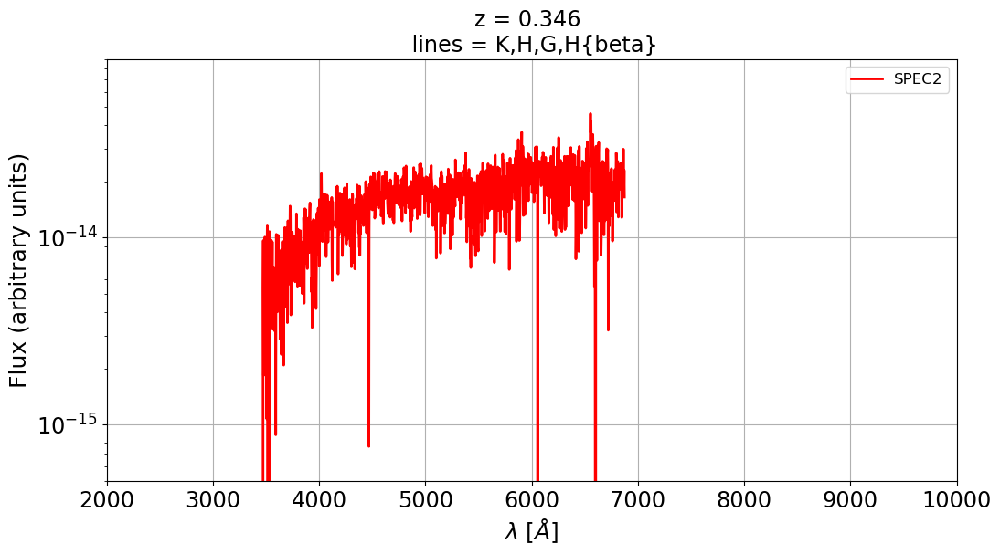

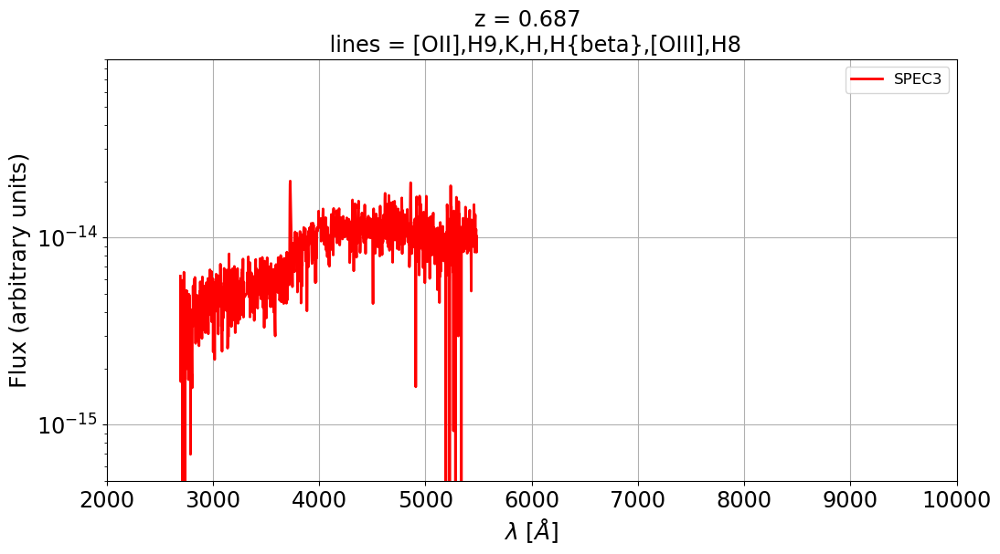

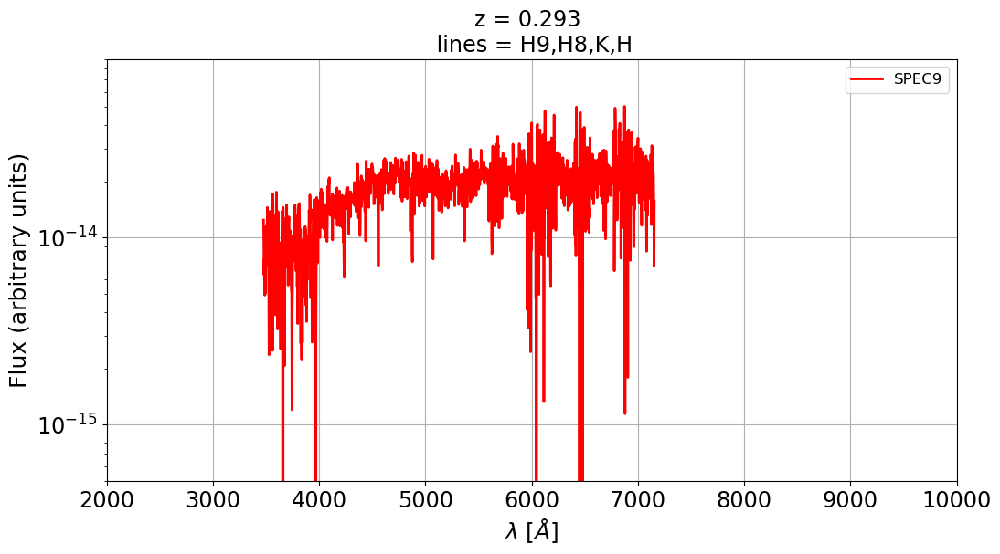

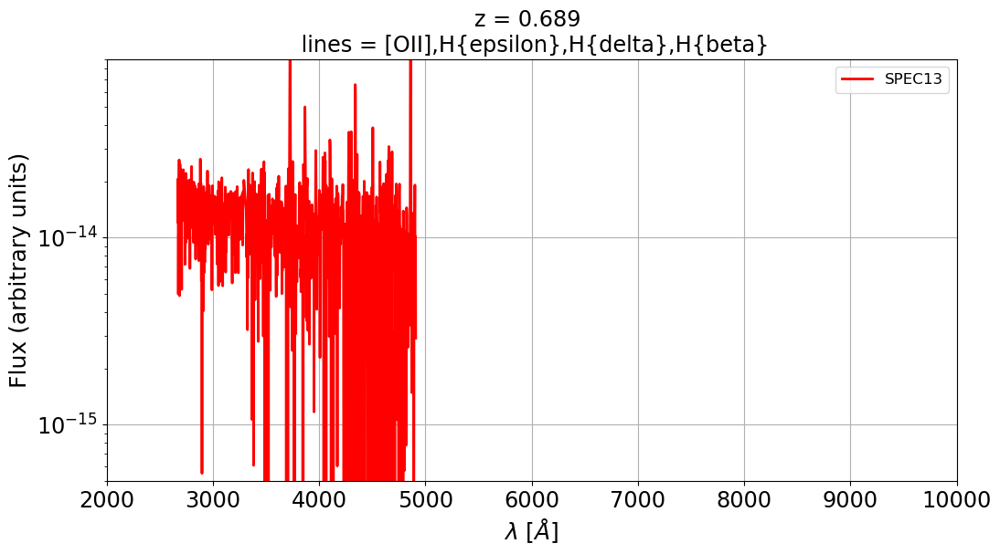

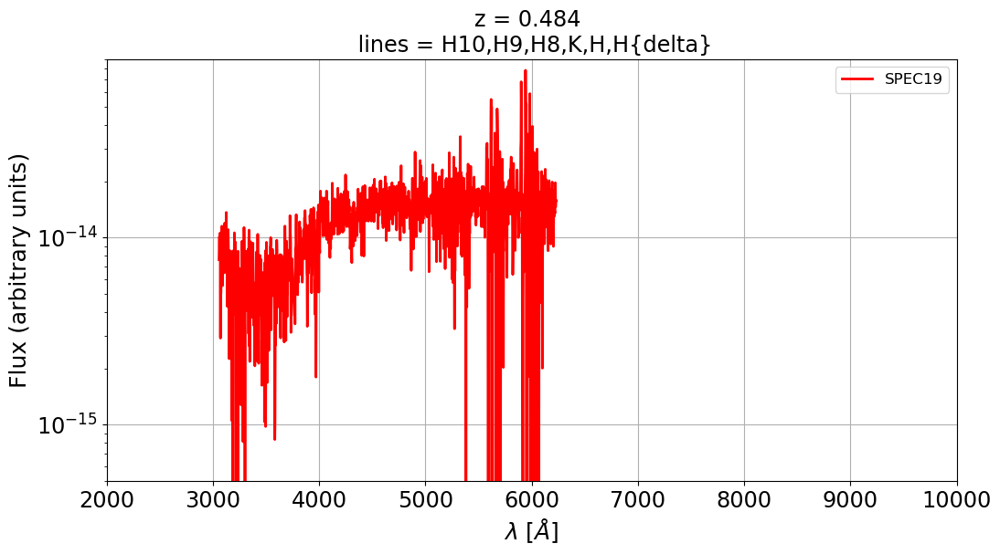

...

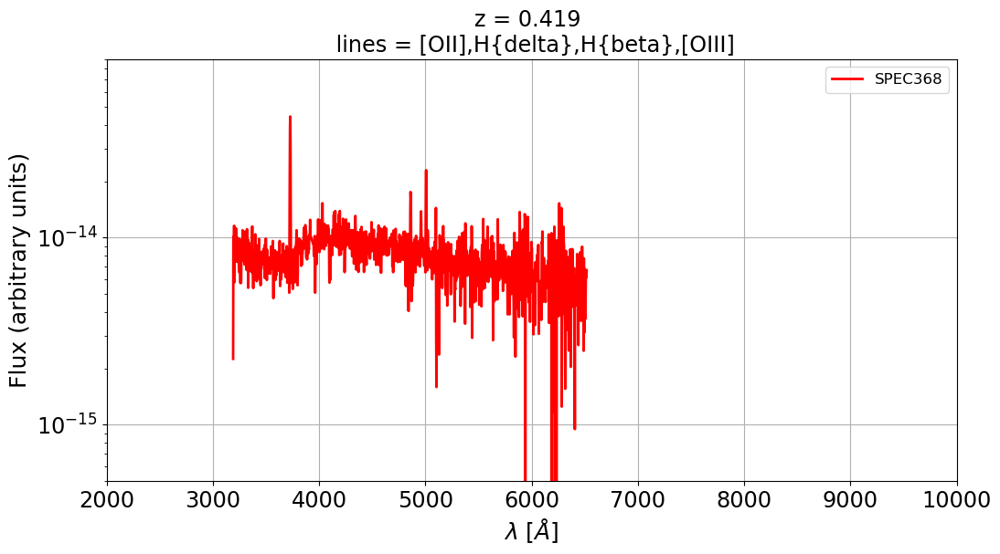

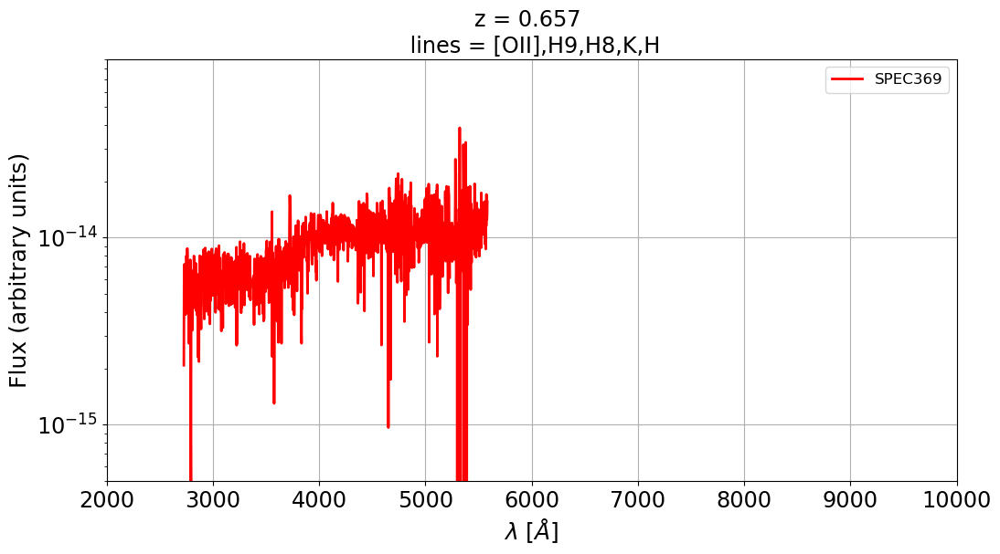

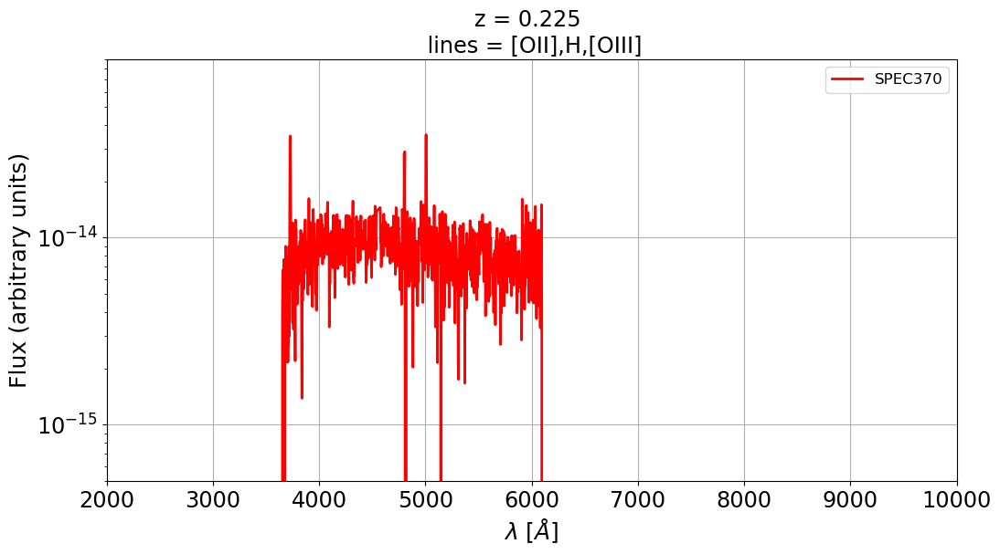

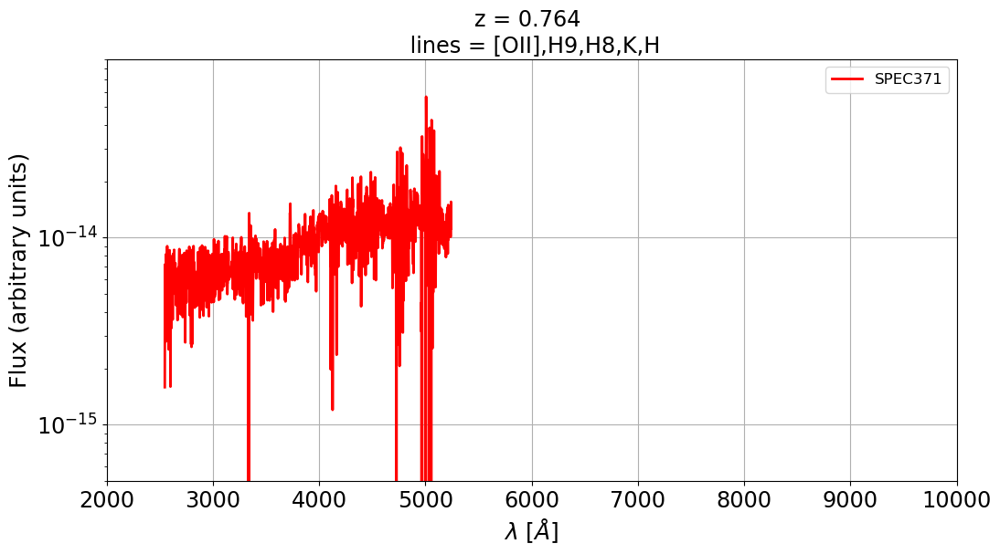

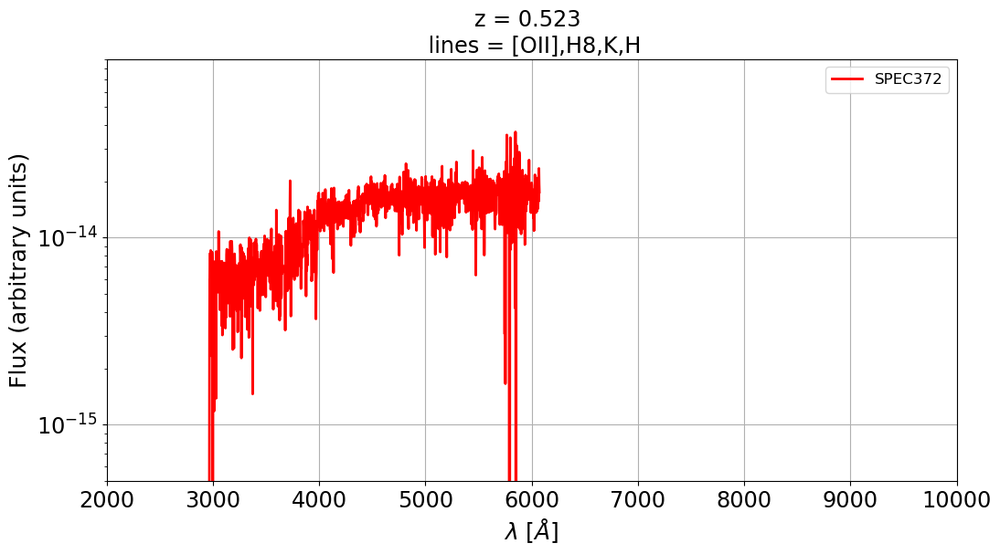

In [ ]:
plot_fors2_raw()

#### redshift distribution

In [ ]:
hist_zspec()

#### Count Zspec

In [ ]:
count_zspec()

#### Sort color

In [ ]:
color_sort()

#### Histogram

In [ ]:
hist_diff_raw_sl()

#### Compare Spectra

In [ ]:
plot_out=True
#plot_out=False
compare_spectra(plot_out)

#### Variance

In [ ]:
hist_var()

#### Save plots

In [ ]:
pdf_pages.close()